# Coordinate descent - Linear regression

This notebook explores how to implement coordinate descent in the case of linear regression. It will serve as a basis for more complex applications of coordinate descent in cases of Lasso regression for example. It also serves as a nice complement to previous notebooks showing the implementation and animation of the better known [gradient descent]

### Sources
 - University of Washington ML course on [coursera][1]
 - [cs.cmu.edu][2]
 
 
[1]: https://www.coursera.org/learn/ml-regression/
[2]: https://www.cs.cmu.edu/~ggordon/10725-F12/slides/25-coord-desc.pdf
[3]: https://xavierbourretsicotte.github.io/animation_ridge.html

## Algorithm

Coordinate descent successively minimizes along coordinate directions to find the minimum of a function. At each iteration, the algorithm determines a coordinate, then minimizes over the corresponding hyperplane while fixing all other coordinates. 

It is based on the idea that minimization can be achieved by minimizing along one direction at a time, i.e. by solving a much simpler univariate problem in a loop. 

In its simplest case of cyclic coordinate descent, we cycle through all variables one at a time, minimizing the cost function with respect to each coordinate. 

- Start with $\mathbf{x}^{(0)} = (x_1^0,...,x_n^0)$
- Round $k+1$ defines $\mathbf{x}^{(k+1)}$ from $\mathbf{x}^{(k)}$ by iteratively solving the single variable optimization problem
    - $\mathbf{x}_i^{(k+1)} = argmin_{\omega} f(x_1^{(k+1)}, ..., x_{i-1}^{(k+1)}, \omega, x_{i+1}^{(k)}, ..., x_n^{(k)})$ 
    - i.e. $x_i : = x_i - \alpha \frac{\partial f}{\partial x_i}(\mathbf{x})$
    - Repeat for each variable $x_i$ in $\mathbf{x}$ for $i = 1,...,n$. 

## Derivation for linear regression (non normalized)

The cost function is:

$$ RSS(\theta) = \frac{1}{2} \sum_{i=1}^m \left[y^{(i)} - \sum_{j=0}^n \theta_j x_j^{(i)}\right]^2$$

Taking the derivative with respect to the parameter $\theta_j$

$$ \frac{\partial }{\partial \theta_j} RSS(\theta) = - \sum_{i=1}^m x_j^{(i)} \left[y^{(i)}  - \sum_{j=0}^n \theta_j x_j^{(i)}\right] $$

Note that up until this step we do not require feature normalization, and can rewrite the expression in vectorized form:

 
\begin{aligned}
	 \frac{\partial }{\partial \theta_j} RSS(\theta) &= \sum_{i=1}^m x_j^{(i)} \left[ \sum_{j=0}^n \theta_j x_j^{(i)} - y^{(i)} \right] 
	 \\
	 & = \mathbf{X_j^T (X \theta - y)}
\end{aligned}


## Derivation for linear regression (normalized data)

In the special case where the design matrix $X$ is normalized: i.e. 

$$ \tilde x_j^{(i)} = \frac{x_j^{(i)}}{\sqrt{\sum_{i=1}^m (x_j^{(i)})^2}}$$ 

We can simplify the expression further by isolating $\theta_j$

\begin{aligned}
	 \frac{\partial }{\partial \theta_j} RSS(\theta) & = -  \sum_{i=1}^m x_j^{(i)}  \left[y^{(i)} - \sum_{j=0}^n \theta_j x_j^{(i)}\right]
	 \\
	 & = -  \sum_{i=1}^m x_j^{(i)}  \left[y^{(i)} - \sum_{k \neq j}^n \theta_k x_k^{(i)} - \theta_j x_j^{(i)}\right]
	 \\
	 & = -  \sum_{i=1}^m x_j^{(i)} \left[y^{(i)} - \sum_{k \neq j}^n \theta_k x_k^{(i)} \right] +  \theta_j \sum_{i=1}^m (x_j^{(i)})^2
	 \\
	 & = -  \sum_{i=1}^m x_j^{(i)}  (y^{(i)} - \hat y^{(i)}(x_{-j})) +  \theta_j 
\end{aligned}

Let $\rho_j =  \sum_{i=1}^m x_j^{(i)}  (y^{(i)} - \hat y^{(i)}(x_{-j}))$ and recall that due to normalization $\sum_{i=1}^m (x_j^{(i)} )^2 = 1$. In effect, $\rho_j$ is a function of the prediction without the feature $j$. 

$$ 	 \frac{\partial }{\partial \theta_j} RSS(\theta)  = - \rho_j  +  \theta_j = 0$$
$$ \theta_j = \rho_j $$





### Libraries 

In [5]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
from matplotlib import animation
from IPython.display import HTML, Image


%matplotlib inline
plt.style.use('seaborn-white')

In [38]:

def costfunction(X,y,theta):
    #Initialisation of useful values 
    m = np.size(y)
    
    #Cost function in vectorized form
    h = X @ theta
    J = float((1./(2*m)) * (h - y).T @ (h - y));    
    return J;


def coordinate_descent(theta,X,y,alpha = .03, num_iters=20):
    '''Coordinate gradient descent for linear regression'''
    #Initialisation of useful values 
    m,n = X.shape
    J_history = []
    theta_0_hist, theta_1_hist = [], [] #For plotting afterwards
    
    
    for i in range(num_iters):
        
        for j in range(n):
            #Coordinate descent in vectorized form
            h = X @ theta 
            gradient =  (X[:,j] @ (h-y))
            theta[j] = theta[j] - alpha * gradient
            
            #Saving values for plots
            J_history.append(costfunction(X,y,theta))
            theta_0_hist.append(theta[0,0])
            theta_1_hist.append(theta[1,0])
                       
    return theta ,J_history, theta_0_hist, theta_1_hist

def coordinate_descent_norm(theta,X,y,alpha = .03, num_iters=100):
    '''Coordinate gradient descent for linear regression - for normalized data'''
    #Initialisation of useful values 
    m,n = X.shape
    X = X / (np.linalg.norm(X,axis = 0)) #normalizing X
    J_history = []
    theta_0_hist, theta_1_hist = [], [] #For plotting afterwards
    
    
    for i in range(num_iters):
        
        for j in range(n):
            #Coordinate descent in vectorized form
            h = (X[:,0:j] @ theta[0:j]) + (X[:,j+1:] @ theta[j+1:])
            theta[j] =  (X[:,j] @ (y - h))
            
            #Saving values for plots
            J_history.append(costfunction(X,y,theta))
            theta_0_hist.append(theta[0,0])
            theta_1_hist.append(theta[1,0])
                       
    return theta ,J_history, theta_0_hist, theta_1_hist


No handles with labels found to put in legend.
No handles with labels found to put in legend.


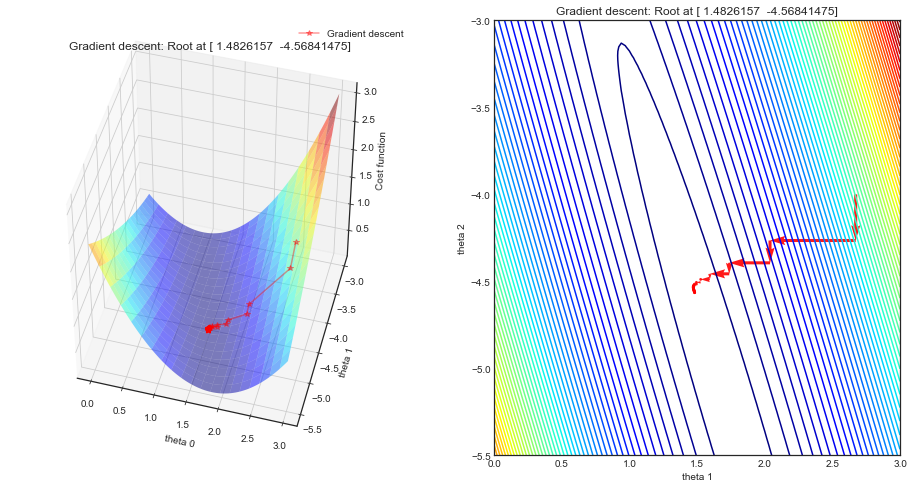

In [39]:
#Creating the dataset (as previously)
x = np.linspace(0,1,40)
noise = 1*np.random.uniform(  size = 40)
y = np.sin(x * 1.5 * np.pi ) 
y_noise = (y + noise).reshape(-1,1)
y_noise = y_noise - y_noise.mean()
X = np.vstack((2*x,x**2)).T
initial_theta = np.array([4,-4.]).reshape(-1,1)

#Setup of meshgrid of theta values
T0, T1 = np.meshgrid(np.linspace(0,3,100),np.linspace(-5.5,-3,100))

#Computing the cost function for each theta combination
zs = np.array(  [costfunction(X, y_noise.reshape(-1,1),np.array([t0,t1]).reshape(-1,1)) 
                     for t0, t1 in zip(np.ravel(T0), np.ravel(T1)) ] )
#Reshaping the cost values    
Z = zs.reshape(T0.shape)


#Computing the gradient descent
theta_result_c,J_history_c, theta_0_c, theta_1_c = coordinate_descent(initial_theta,X,y_noise, alpha = .009) 

#Angles needed for quiver plot
anglesx = np.array(theta_0_c)[1:] - np.array(theta_0_c)[:-1]
anglesy = np.array(theta_1_c)[1:] - np.array(theta_1_c)[:-1]

%matplotlib inline
fig = plt.figure(figsize = (16,8))

#Surface plot
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(T0, T1, Z, rstride = 5, cstride = 5, cmap = 'jet', alpha=0.5)
ax.plot(theta_0_c,theta_1_c,J_history_c, marker = '*', color = 'r', alpha = .4, label = 'Gradient descent')

ax.set_xlabel('theta 0')
ax.set_ylabel('theta 1')
ax.set_zlabel('Cost function')
ax.set_title('Gradient descent: Root at {}'.format(theta_result_c.ravel()))
ax.view_init(45, -75)
ax.legend()


#Contour plot
ax = fig.add_subplot(1, 2, 2)
ax.contour(T0, T1, Z, 70, cmap = 'jet')
ax.quiver(theta_0_c[:-1], theta_1_c[:-1], anglesx, anglesy, scale_units = 'xy', angles = 'xy', scale = 1, color = 'r', alpha = .9)
ax.set_xlabel('theta 1')
ax.set_ylabel('theta 2')
ax.set_title('Gradient descent: Root at {}'.format(theta_result_c.ravel()))
ax.legend()

plt.legend()
plt.show()

### Closed form solution 
Note that coordinate descent does not converge as the number of steps is too small. We have limited the reduce the size of the animation. 

In [41]:
np.linalg.inv(X.T@X) @X.T @ y_noise

array([[ 1.76752961],
       [-5.31198526]])

# Animation of the coordinate descent  

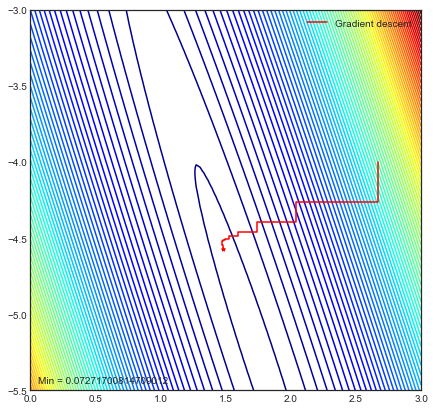

In [40]:
#Plot the contour
fig1, ax1 = plt.subplots(figsize = (7,7))
ax1.contour(T0, T1, Z, 100, cmap = 'jet')

#theta_result_c,J_history_c, theta_0_c, theta_1_c

# Create animation
line, = ax1.plot([], [], 'r', label = 'Gradient descent', lw = 1.5)
point, = ax1.plot([], [], '*', color = 'red', markersize = 4)
value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

def init_1():
    line.set_data([], [])
    point.set_data([], [])
    value_display.set_text('')

    return line, point, value_display

def animate_1(i):
    # Animate line
    line.set_data(theta_0_c[:i], theta_1_c[:i])
    
    # Animate points
    point.set_data(theta_0_c[i], theta_1_c[i])

    # Animate value display
    value_display.set_text('Min = ' + str(J_history_c[i]))

    return line, point, value_display

ax1.legend(loc = 1)

anim1 = animation.FuncAnimation(fig1, animate_1, init_func=init_1,
                               frames=len(theta_0_c), interval=100, 
                               repeat_delay=60, blit=True)
#plt.show()
HTML(anim1.to_jshtml())

In [43]:
#Saving the animation
anim1.save('/Users/User/Desktop/Data/Learning_Notebooks/Machine Learning/files/animation3_CD.gif', writer='imagemagick', fps=60)